In [24]:
from collections import OrderedDict
import re
import os

import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import torch
from tqdm.notebook import tqdm

from eval import get_run_metrics, read_run_dir, get_model_from_run
from plot_utils import basic_plot, collect_results, relevant_model_names

%matplotlib inline
%load_ext autoreload
%autoreload 2

sns.set_theme('notebook', 'darkgrid')
palette = sns.color_palette('colorblind')

run_dir = "/home/xc425/project/models"

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [12]:
df = read_run_dir(run_dir)
df  # list all the runs in our run_dir

,run_id,task,model,kwargs,num_tasks,num_examples,n_dims,n_layer,n_head,run_name
76,stackxy_model_five2embeds_noise20d_1,linear_regression,Transformer-five,,-1,-1,20,5,8,linear_regression_five2embeds_stackxy_noise20d...
7,stackxy_model_five2embeds_noise30d_1,linear_regression,Transformer-five,,-1,-1,30,5,8,linear_regression_five2embeds_stackxy_noise30d...
34,aeaf99ce-bfac-4b46-b9d9-d86edfc0c786,linear_regression,Transformer-five,,-1,-1,5,5,8,linear_regression_five_10
117,3609090c-9b6d-40eb-9d0c-b02cb7bfbfdc,linear_regression,Transformer-five,,-1,-1,10,5,8,linear_regression_five_no_pos_10d_1
18,3616936c-0ca1-4def-b561-63a242954120,linear_regression,Transformer-five,,-1,-1,15,5,8,linear_regression_five_no_pos_15d_1
...,...,...,...,...,...,...,...,...,...,...
113,2426cdcb-cbe4-45e2-addb-a83ada3cff62,linear_regression,Transformer-xs,,-1,-1,5,3,2,linear_regression_tiny_5d_ex40_t500_11
23,a5e9a28a-c8cc-4bf7-b44a-25ff9ac3b6db,linear_regression,Transformer-xs,,-1,-1,5,3,2,linear_regression_tiny_try2nd
101,b83ad19c-27a5-4eae-9a76-3fa4655febbd,linear_regression,Transformer-xs,,-1,-1,5,3,2,linear_regression_tiny_try3rd
11,fb56e506-3bc5-4e94-96ba-6e45d0259808,linear_regression,Transformer-xs,,-1,-1,5,3,2,linear_regression_tiny_try4th


In [28]:
task = "linear_regression"
#task = "sparse_linear_regression"
#task = "decision_tree"
#task = "relu_2nn_regression"

run_id = "stackxy_model_three_noise20d_dtrain_1"  # if you train more models, replace with the run_id from the table above

run_path = os.path.join(run_dir, task, run_id)
recompute_metrics = False

if recompute_metrics:
    get_run_metrics(run_path)  # these are normally precomputed at the end of training

# Plot pre-computed metrics

linear_regression_three_stackxy_noise20d_dtrain_2000ex_1 stackxy_model_three_noise20d_dtrain_1


100%|██████████| 15/15 [00:00<00:00, 416652.72it/s]


{'half_subspace': {'Transformer-three': {'mean': [0.9713808059692383, 0.8480062484741211, 0.7778361320495606, 0.7175783634185791, 0.7067770957946777, 0.5977077007293701, 0.5237659454345703, 0.42365713119506837, 0.39119701385498046, 0.33228726387023927, 0.28204753398895266, 0.27884502410888673, 0.2140021562576294, 0.18365968465805055, 0.17011432647705077, 0.1421866774559021, 0.13847267627716064, 0.12501429319381713, 0.12488605976104736, 0.11613779067993164, 0.0954774022102356, 0.08893761634826661, 0.09374435544013977, 0.08373973965644836, 0.08775542974472046, 0.08103616833686829, 0.07819541692733764, 0.07910888791084289, 0.08080219030380249, 0.08403404355049134, 0.07477824091911316, 0.0835444450378418, 0.08032935857772827, 0.07229355573654175, 0.08175193071365357, 0.08169029951095581, 0.07963957786560058, 0.08180567026138305, 0.0855322003364563, 0.08558479547500611, 0.08325761556625366, 0.08321919441223144, 0.0838493525981903, 0.08551303148269654, 0.07856639623641967, 0.0854882895946502

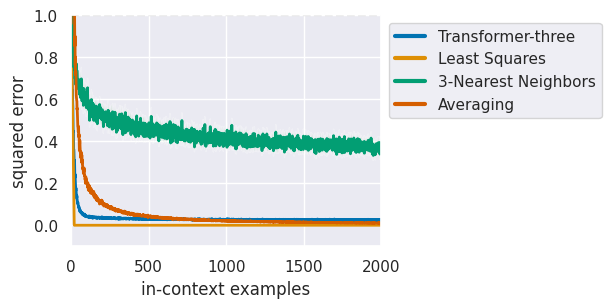

In [29]:
def valid_row(r):
    return r.task == task and r.run_id == run_id

metrics = collect_results(run_dir, df, valid_row=valid_row)
print(metrics)
_, conf = get_model_from_run(run_path, only_conf=True)
n_dims = conf.model.n_dims

models = relevant_model_names[task]
basic_plot(metrics["standard"], models=models)
plt.show()

['Transformer-five', 'Least Squares', '3-Nearest Neighbors', 'Averaging']
{'Transformer-five': {'mean': [0.9975377082824707, 1.0082700729370118, 0.9960912704467774, 0.9445652961730957, 0.8876581192016602, 0.8637395858764648, 0.743401575088501, 0.7279051780700684, 0.6530564785003662, 0.666977834701538, 0.6593562126159668, 0.6068381786346435, 0.599033260345459, 0.5963934898376465, 0.554057264328003, 0.5346173286437989, 0.5427200794219971, 0.465739107131958, 0.46315655708312986, 0.3945096254348755, 0.43634486198425293, 0.440746545791626, 0.41965303421020506, 0.40765771865844724, 0.4009376525878906, 0.3699404239654541, 0.33386409282684326, 0.35242226123809817, 0.3394601345062256, 0.33632094860076905, 0.316164231300354, 0.3133664608001709, 0.3022258520126343, 0.30928726196289064, 0.2918410062789917, 0.27718029022216795, 0.2842698574066162, 0.25500826835632323, 0.2850520610809326, 0.2669400691986084, 0.2454814910888672, 0.24625236988067628, 0.24545559883117676, 0.24364745616912842, 0.2369193

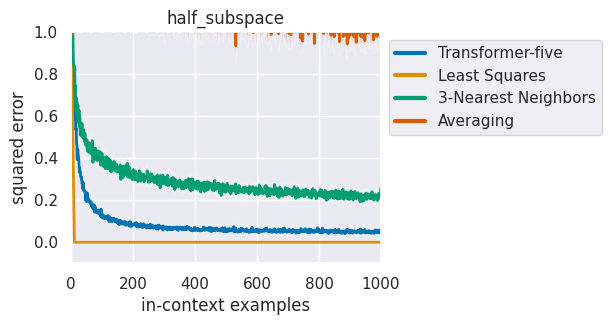

['Transformer-five', 'Least Squares', '3-Nearest Neighbors', 'Averaging']
{'Transformer-five': {'mean': [1.0216115951538085, 0.9996786117553711, 1.0546586990356446, 0.9042535781860351, 0.984217357635498, 0.900086784362793, 0.8032381057739257, 0.793187952041626, 0.8665196418762207, 0.8402397155761718, 0.854483699798584, 0.7789531707763672, 0.7825185298919678, 0.8245981216430665, 0.7345539093017578, 0.7230193138122558, 0.6257225036621094, 0.6639640808105469, 0.6416755676269531, 0.6436377048492432, 0.6687375545501709, 0.6258517265319824, 0.6292553424835206, 0.6010714054107666, 0.603610897064209, 0.5820164680480957, 0.6028325080871582, 0.5858911514282227, 0.5609754085540771, 0.608960771560669, 0.5374292850494384, 0.5435653686523437, 0.5719988822937012, 0.5397773742675781, 0.5620951652526855, 0.5088136672973633, 0.5545171737670899, 0.5209013938903808, 0.537550973892212, 0.49739747047424315, 0.5265406608581543, 0.46348037719726565, 0.470886754989624, 0.49081130027770997, 0.49871230125427246,

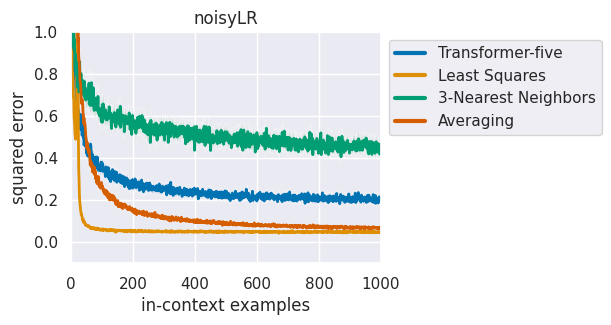

['Transformer-five', 'Least Squares', '3-Nearest Neighbors', 'Averaging']
{'Transformer-five': {'mean': [1.0243837356567382, 1.0163128852844239, 0.9561763763427734, 1.022476577758789, 0.9506754875183105, 0.9827424049377441, 1.0109354972839355, 0.9676589965820312, 0.9819013595581054, 1.0021612167358398, 0.9713821411132812, 0.9709205627441406, 0.9783287048339844, 1.0366640090942383, 1.0407663345336915, 1.0480716705322266, 1.0431984901428222, 0.9858587265014649, 1.0051795959472656, 1.0211578369140626, 0.00354464054107666, 0.00364852175116539, 0.003753548115491867, 0.0036541711539030074, 0.003665417805314064, 0.0037056289613246916, 0.003764998912811279, 0.003778253123164177, 0.003839243948459625, 0.0038900632411241532, 0.003972616046667099, 0.004038605839014053, 0.004074626415967941, 0.00413484126329422, 0.004157883673906326, 0.00418894961476326, 0.004269311577081681, 0.004351045936346054, 0.0043643653392791745, 0.004385208711028099, 0.00445702150464058, 0.004541555792093277, 0.00459676943

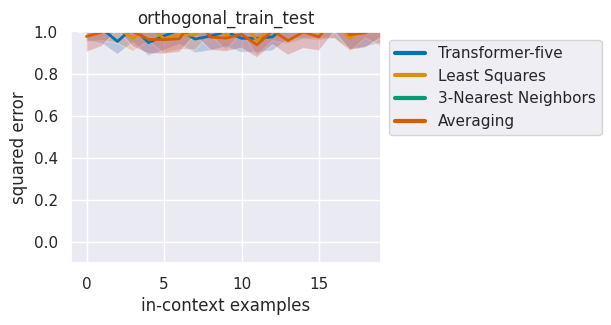

['Transformer-five', 'Least Squares', '3-Nearest Neighbors', 'Averaging']
{'Transformer-five': {'mean': [1.021995735168457, 0.9474739074707031, 0.6762002468109131, 0.5854335308074952, 0.4841325283050537, 0.4934703826904297, 0.4564635753631592, 0.39438316822052, 0.40201435089111326, 0.3978424072265625, 0.3944987773895264, 0.36624560356140134, 0.357208251953125, 0.35823707580566405, 0.3541614532470703, 0.3359058380126953, 0.31667089462280273, 0.34445834159851074, 0.3204629421234131, 0.3508270740509033, 0.3333354234695435, 0.3449892044067383, 0.337054181098938, 0.31573550701141356, 0.329243540763855, 0.32784385681152345, 0.3058112859725952, 0.3167168617248535, 0.2829106569290161, 0.29970004558563235, 0.30271685123443604, 0.3251078128814697, 0.28458371162414553, 0.31467013359069823, 0.298560643196106, 0.28753817081451416, 0.27962489128112794, 0.28351750373840334, 0.2825348377227783, 0.25846233367919924, 0.26364841461181643, 0.26610546112060546, 0.3069716691970825, 0.29033584594726564, 0.28

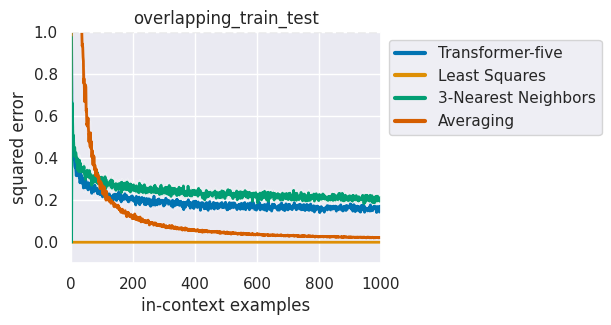

['Transformer-five', 'Least Squares', '3-Nearest Neighbors', 'Averaging']
{'Transformer-five': {'mean': [1.003462028503418, 1.000031089782715, 0.9835919380187989, 0.9589204788208008, 1.0293394088745118, 0.9178213119506836, 0.9193277359008789, 1.0299839973449707, 0.9501199722290039, 0.94107027053833, 0.9098111152648926, 0.9052543640136719, 0.898430347442627, 0.9130632400512695, 0.9211318016052246, 0.9431405067443848, 0.9151064872741699, 0.9270007133483886, 0.9076911926269531, 0.8953851699829102, 0.8592885971069336, 0.9045930862426758, 0.8699485778808593, 0.8768423080444336, 0.8790114402770997, 0.8449494361877441, 0.816226577758789, 0.8310445785522461, 0.833306884765625, 0.8597003936767578, 0.8777599334716797, 0.8159649848937989, 0.8065095901489258, 0.880457878112793, 0.8503007888793945, 0.8905403137207031, 0.8833405494689941, 0.8172025680541992, 0.7516654968261719, 0.8296298980712891, 0.9038966178894043, 0.8821011543273926, 0.891888427734375, 0.8054767608642578, 0.8172222137451172, 0.79

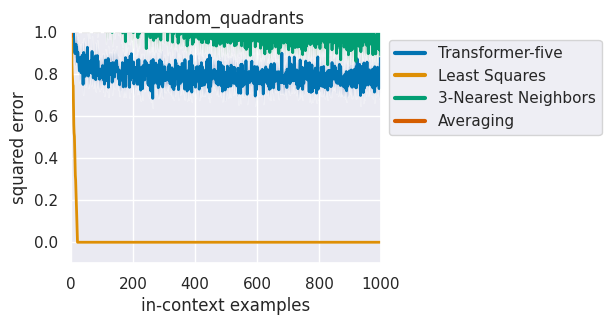

['Transformer-five', 'Least Squares', '3-Nearest Neighbors', 'Averaging']
{'Transformer-five': {'mean': [0.1105843186378479, 0.10966873168945312, 0.11287721395492553, 0.11042639017105102, 0.10296767950057983, 0.11117347478866577, 0.11132757663726807, 0.09995837211608886, 0.10342859029769898, 0.10353744029998779, 0.09873100519180297, 0.10069453716278076, 0.10283191204071045, 0.09924249649047852, 0.10534166097640991, 0.10892059803009033, 0.11351487636566163, 0.1036454439163208, 0.10555787086486816, 0.10154049396514893, 0.10528829097747802, 0.09784379005432128, 0.10577423572540283, 0.10320104360580444, 0.10215089321136475, 0.10348739624023437, 0.09693086743354798, 0.0977288842201233, 0.10184154510498047, 0.1021796464920044, 0.09474768638610839, 0.09678767323493957, 0.0986742615699768, 0.10576624870300293, 0.0981723427772522, 0.10057783126831055, 0.0938500702381134, 0.10491836071014404, 0.10599672794342041, 0.10252760648727417, 0.1002349853515625, 0.10784337520599366, 0.09478136301040649, 

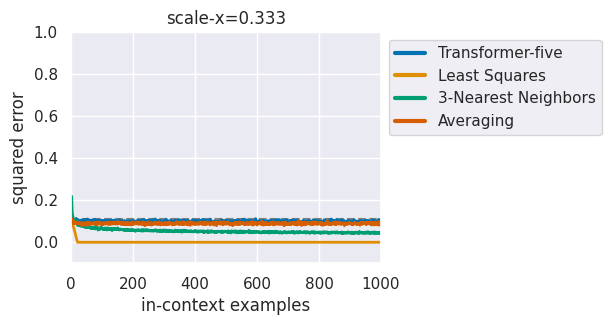

['Transformer-five', 'Least Squares', '3-Nearest Neighbors', 'Averaging']
{'Transformer-five': {'mean': [0.24676249027252198, 0.24733235836029052, 0.272083044052124, 0.2500422716140747, 0.23916008472442626, 0.25008196830749513, 0.22347359657287597, 0.24522016048431397, 0.23917717933654786, 0.2169130802154541, 0.23035616874694825, 0.22556228637695314, 0.21532630920410156, 0.23001248836517335, 0.21269629001617432, 0.19502079486846924, 0.21630070209503174, 0.22424373626708985, 0.2124103546142578, 0.21688370704650878, 0.21757848262786866, 0.20659704208374025, 0.22406938076019287, 0.21140074729919434, 0.21458725929260253, 0.20569453239440919, 0.219878625869751, 0.21024069786071778, 0.2093916654586792, 0.20381460189819336, 0.20881149768829346, 0.20663998126983643, 0.20256924629211426, 0.19204069375991822, 0.22164289951324462, 0.19167048931121827, 0.2066502809524536, 0.22019011974334718, 0.20158686637878417, 0.1862654447555542, 0.19809105396270751, 0.18591728210449218, 0.2042604923248291, 0.1

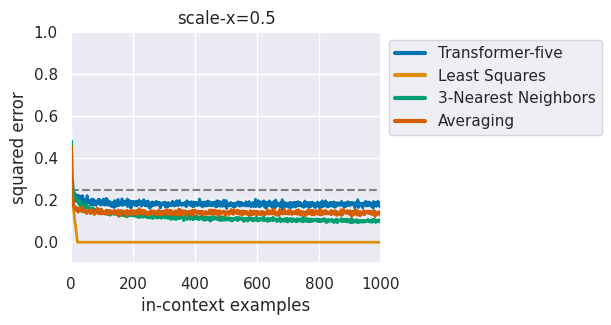

['Transformer-five', 'Least Squares', '3-Nearest Neighbors', 'Averaging']
{'Transformer-five': {'mean': [4.079162216186523, 3.8520816802978515, 4.106893157958984, 4.086500930786133, 4.099538421630859, 3.3357173919677736, 3.7905303955078127, 3.8563671112060547, 3.5606273651123046, 3.3564659118652345, 3.53039665222168, 3.474810028076172, 3.203084182739258, 3.2957523345947264, 3.145340347290039, 2.987369728088379, 2.8087652206420897, 2.9359201431274413, 2.609950828552246, 2.7325326919555666, 2.8809183120727537, 2.6187129974365235, 2.448893928527832, 2.4182958602905273, 2.4365665435791017, 2.64209098815918, 2.3970718383789062, 2.401616859436035, 2.3408445358276366, 2.4400039672851563, 2.317677688598633, 2.4392812728881834, 2.1210693359375, 2.1205169677734377, 2.4454198837280274, 2.1233036041259767, 2.172844123840332, 2.0697162628173826, 2.09893798828125, 2.0156139373779296, 2.0141880035400392, 2.006333351135254, 1.8870677947998047, 1.9773193359375, 1.8869968414306642, 1.7568843841552735, 1

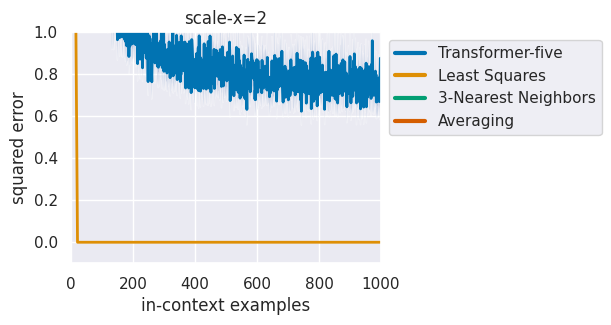

['Transformer-five', 'Least Squares', '3-Nearest Neighbors', 'Averaging']
{'Transformer-five': {'mean': [8.69741439819336, 8.789039611816406, 8.89651870727539, 8.835760498046875, 9.074533843994141, 9.072506713867188, 8.462351989746093, 8.712095642089844, 8.58347396850586, 8.859508514404297, 9.535517120361328, 7.813561248779297, 8.004900360107422, 7.745601654052734, 7.673166656494141, 8.075663757324218, 7.2118408203125, 7.245805358886718, 7.276767730712891, 7.373652648925781, 7.856626892089844, 7.4734954833984375, 7.172410583496093, 7.549552917480469, 6.880057525634766, 7.117037200927735, 7.320213317871094, 7.657093811035156, 6.808406066894531, 6.812248229980469, 6.7480010986328125, 6.4635566711425785, 6.9150749206542965, 6.968132781982422, 6.381253814697265, 6.082052612304688, 6.157926559448242, 6.418094635009766, 5.830237960815429, 6.124346923828125, 6.203290557861328, 6.2752738952636715, 6.054633712768554, 6.226744842529297, 6.036100006103515, 5.6367919921875, 5.696401214599609, 5.57

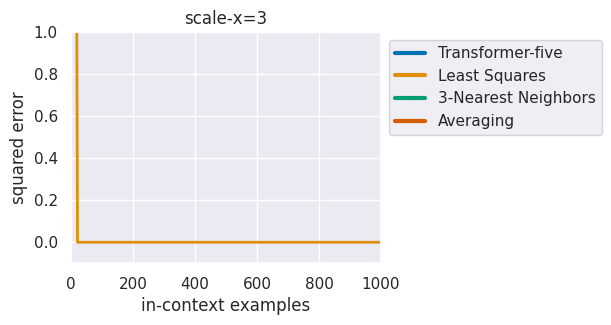

['Transformer-five', 'Least Squares', '3-Nearest Neighbors', 'Averaging']
{'Transformer-five': {'mean': [0.11080963611602783, 0.11757129430770874, 0.10250027179718017, 0.10334519147872925, 0.10681036710739136, 0.10086475610733033, 0.10073938369750976, 0.10503394603729248, 0.0980583369731903, 0.09257156252861024, 0.08845503926277161, 0.10304422378540039, 0.09265797734260559, 0.08867096900939941, 0.09573124051094055, 0.08273929357528687, 0.08671348690986633, 0.0867810845375061, 0.08536084294319153, 0.07426525950431824, 0.08177031278610229, 0.07838862538337707, 0.08113751411437989, 0.07666525840759278, 0.07316550612449646, 0.07767970561981201, 0.07324777245521545, 0.07608923316001892, 0.07686087489128113, 0.07849354147911072, 0.07563135027885437, 0.07457083463668823, 0.07138038873672485, 0.07333039045333863, 0.07320117950439453, 0.07179224491119385, 0.06861109137535096, 0.07351144552230834, 0.07742893695831299, 0.07218292951583863, 0.0672562301158905, 0.07115310430526733, 0.06138029694557

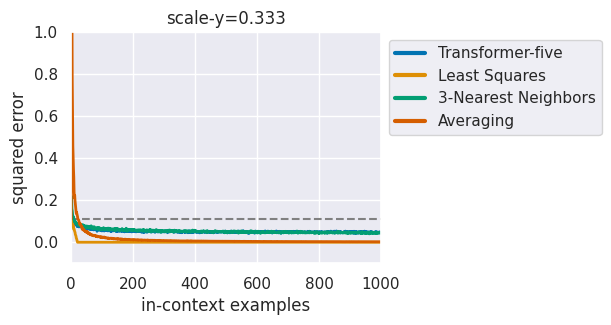

['Transformer-five', 'Least Squares', '3-Nearest Neighbors', 'Averaging']
{'Transformer-five': {'mean': [0.2607868671417236, 0.266570520401001, 0.23439693450927734, 0.2410109519958496, 0.21882414817810059, 0.21495604515075684, 0.2378096342086792, 0.22493431568145753, 0.20624866485595703, 0.21216015815734862, 0.22479867935180664, 0.1898876428604126, 0.18985515832901, 0.1861608862876892, 0.17156105041503905, 0.1907243013381958, 0.18729184865951537, 0.18534752130508422, 0.1800671935081482, 0.16432712078094483, 0.17086830139160156, 0.1700068235397339, 0.17187623977661132, 0.153631591796875, 0.15998632907867433, 0.15884022712707518, 0.1572555422782898, 0.15284491777420045, 0.15591781139373778, 0.15901585817337036, 0.14452240467071534, 0.14196329116821288, 0.14721622467041015, 0.15585992336273194, 0.15375180244445802, 0.1476287603378296, 0.14535727500915527, 0.15601565837860107, 0.1444136381149292, 0.13769582509994507, 0.14271032810211182, 0.1282671570777893, 0.13496828079223633, 0.121326279

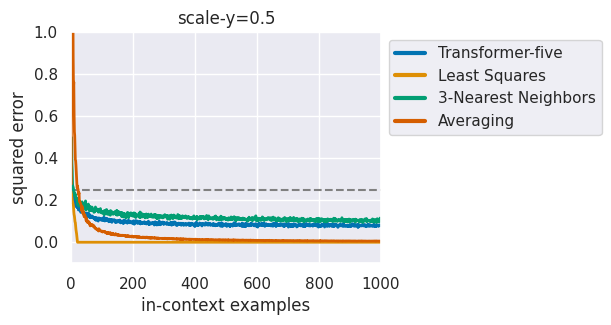

['Transformer-five', 'Least Squares', '3-Nearest Neighbors', 'Averaging']
{'Transformer-five': {'mean': [4.011807632446289, 4.142998504638672, 3.8999595642089844, 3.6532756805419924, 3.675171661376953, 3.5794387817382813, 3.5524307250976563, 3.277535247802734, 3.39776725769043, 3.460078811645508, 3.232979583740234, 2.9810052871704102, 3.106162452697754, 2.8615192413330077, 3.0492832183837892, 2.7384531021118166, 2.720467185974121, 2.748080825805664, 2.5851192474365234, 2.6239345550537108, 2.3290796279907227, 2.554789352416992, 2.530643844604492, 2.492130088806152, 2.6187795639038085, 2.228708267211914, 2.3490930557250977, 2.275579833984375, 2.2774723052978514, 2.3212366104125977, 2.3574071884155274, 2.1318328857421873, 2.0671642303466795, 2.2361984252929688, 2.1966625213623048, 2.081386756896973, 2.0673202514648437, 1.8968923568725586, 1.9328815460205078, 1.8536693572998046, 2.1495208740234375, 1.7934919357299806, 1.9377300262451171, 1.88245849609375, 1.8500295639038087, 1.956859588623

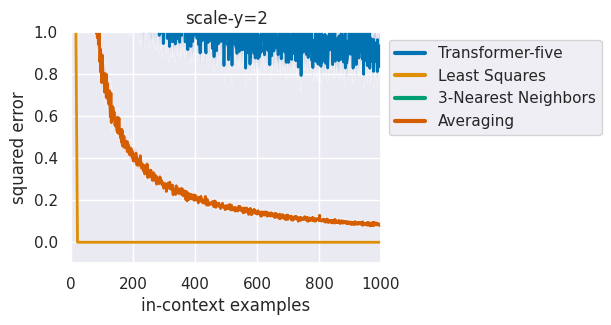

['Transformer-five', 'Least Squares', '3-Nearest Neighbors', 'Averaging']
{'Transformer-five': {'mean': [9.237551879882812, 8.461019134521484, 9.252436065673828, 8.67952651977539, 8.491751861572265, 8.239754486083985, 8.095988464355468, 8.261390686035156, 7.713099670410156, 7.573915100097656, 7.708893585205078, 6.763069915771484, 7.3489631652832035, 7.202934265136719, 7.065805053710937, 6.598341369628907, 6.351615524291992, 6.748649597167969, 6.354901123046875, 6.270708084106445, 6.4146881103515625, 5.578739166259766, 6.593701934814453, 6.4151161193847654, 6.265861892700196, 6.444456481933594, 5.86645736694336, 6.4824974060058596, 5.360269927978516, 5.439737701416016, 5.541312408447266, 5.743425369262695, 5.827619171142578, 5.353483963012695, 5.349394989013672, 6.0122215270996096, 5.95623779296875, 5.711447143554688, 5.4378711700439455, 5.722710037231446, 5.4724773406982425, 5.4266410827636715, 5.340279388427734, 5.477664947509766, 5.659259033203125, 5.034840774536133, 5.07863388061523

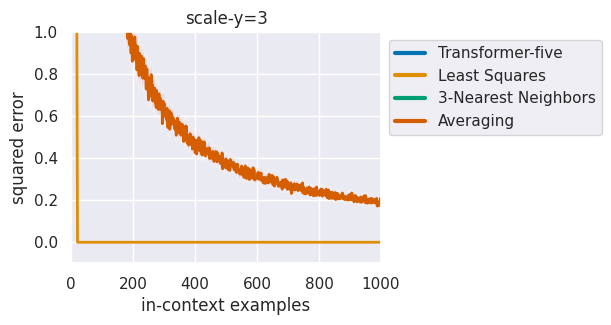

['Transformer-five', 'Least Squares', '3-Nearest Neighbors', 'Averaging']
{'Transformer-five': {'mean': [1.2019628524780273, 0.9211009025573731, 0.9100221633911133, 0.7869314670562744, 0.6780088901519775, 0.6405697822570801, 0.5773316383361816, 0.5321680068969726, 0.4637762546539307, 0.40304861068725584, 0.41866579055786135, 0.42137537002563474, 0.43053975105285647, 0.4034393787384033, 0.44609594345092773, 0.3448089599609375, 0.32621350288391116, 0.38815131187438967, 0.34778728485107424, 0.3767080783843994, 0.40669822692871094, 0.3510023593902588, 0.35456089973449706, 0.3442898988723755, 0.35216755867004396, 0.351000452041626, 0.3887645721435547, 0.310453200340271, 0.3359212875366211, 0.34754512310028074, 0.3199263095855713, 0.318848180770874, 0.30318236351013184, 0.3658034563064575, 0.35439391136169435, 0.3283792018890381, 0.38960583209991456, 0.32607669830322267, 0.30555477142333987, 0.3479617595672607, 0.31945750713348386, 0.3132363796234131, 0.32730400562286377, 0.31309852600097654

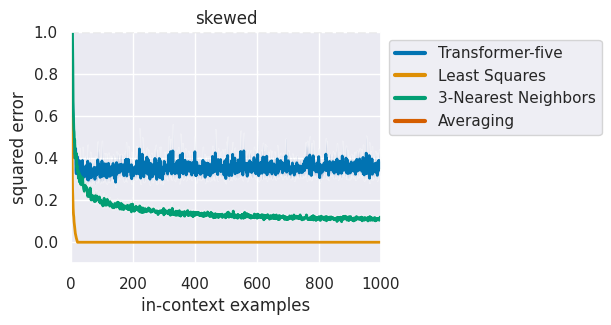

In [21]:
# plot any OOD metrics
for name, metric in metrics.items():
    if name == "standard": continue
   
    if "scale" in name:
        scale = float(name.split("=")[-1])**2
    else:
        scale = 1.0

    trivial = 1.0 if "noisy" not in name else (1+1/n_dims)
    fig, ax = basic_plot(metric, models=models, trivial=trivial * scale)
    ax.set_title(name)
    
    if "ortho" in name:
        ax.set_xlim(-1, n_dims - 1)
    # ax.set_ylim(-.1 * scale, 1.5 * scale)

    plt.show()

# Interactive setup

We will now directly load the model and measure its in-context learning ability on a batch of random inputs. (In the paper we average over multiple such batches to obtain better estimates.)

In [6]:
from samplers import get_data_sampler
from tasks import get_task_sampler

In [7]:
model, conf = get_model_from_run(run_path)

n_dims = conf.model.n_dims
batch_size = conf.training.batch_size

data_sampler = get_data_sampler(conf.training.data, n_dims)
task_sampler = get_task_sampler(
    conf.training.task,
    n_dims,
    batch_size,
    **conf.training.task_kwargs
)

In [8]:
task = task_sampler()
xs = data_sampler.sample_xs(b_size=batch_size, n_points=conf.training.curriculum.points.end)
ys = task.evaluate(xs)

In [9]:
with torch.no_grad():
    pred = model(xs, ys)

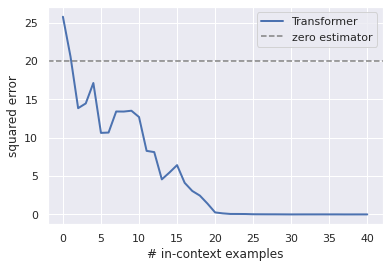

In [10]:
metric = task.get_metric()
loss = metric(pred, ys).numpy()

sparsity = conf.training.task_kwargs.sparsity if "sparsity" in conf.training.task_kwargs else None
baseline = {
    "linear_regression": n_dims,
    "sparse_linear_regression": sparsity,
    "relu_2nn_regression": n_dims,
    "decision_tree": 1,
}[conf.training.task]

plt.plot(loss.mean(axis=0), lw=2, label="Transformer")
plt.axhline(baseline, ls="--", color="gray", label="zero estimator")
plt.xlabel("# in-context examples")
plt.ylabel("squared error")
plt.legend()
plt.show()

As an exploration example, let's see how robust the model is to doubling all the inputs.

In [11]:
xs2 = 2 * xs
ys2 = task.evaluate(xs2)
with torch.no_grad():
    pred2 = model(xs2, ys2)

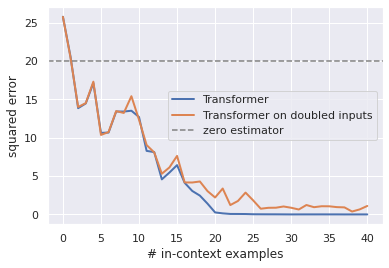

In [12]:
loss2 = metric(pred2, ys2).numpy()

plt.plot(loss.mean(axis=0), lw=2, label="Transformer")
plt.plot(loss2.mean(axis=0) / 4, lw=2, label="Transformer on doubled inputs")
plt.axhline(baseline, ls="--", color="gray", label="zero estimator")
plt.xlabel("# in-context examples")
plt.ylabel("squared error")
plt.legend()
plt.show()

The error does increase, especially when the number of in-context examples exceeds the dimension, but the model is still relatively accurate.